<a href="https://colab.research.google.com/github/Abdelsadeq/Deep-Learning/blob/main/Image%20semilarity/Image_Search_Fine_tuning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf  # Import TensorFlow library for machine learning
import tensorflow_hub as hub  # Import TensorFlow Hub for accessing pre-trained models
import tensorflow_datasets as tfds  # Import TensorFlow Datasets for accessing pre-built datasets
import numpy as np  # Import NumPy library for numerical computing
import matplotlib.pyplot as plt  # Import Matplotlib library for visualization
import functools  # Import functools module for higher-order functions and operations
import ipywidgets as w  # Import the ipywidgets library # This code imports the ipywidgets library, which provides interactive widgets for the Jupyter Notebook.




In [2]:
(train_ds, valid_ds), info = tfds.load("oxford_flowers102", split=["train", "validation"], as_supervised=True, with_info=True)
# Load the Oxford Flowers 102 dataset, splitting it into training and validation sets.
# as_supervised=True loads the data in supervised mode, returning (image, label) pairs.
# with_info=True provides additional information about the dataset, including label mapping.

int_to_class_label = info.features['label'].int2str
# Retrieve the label mapping from integer to class label.
# This will be useful to convert integer labels to their corresponding class names later.


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Shuffling /root/tensorflow_datasets/oxford_flowers102/2.1.1.incomplete40UF00/oxford_flowers102-train.tfrecord*…

Generating test examples...:   0%|          | 0/6149 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_flowers102/2.1.1.incomplete40UF00/oxford_flowers102-test.tfrecord*.…

Generating validation examples...:   0%|          | 0/1020 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_flowers102/2.1.1.incomplete40UF00/oxford_flowers102-validation.tfre…

Dataset oxford_flowers102 downloaded and prepared to /root/tensorflow_datasets/oxford_flowers102/2.1.1. Subsequent calls will reuse this data.


In [3]:
CLASSES_TO_CONSIDER = list(range(20)) # First 20 classes
IMG_WIDTH = IMG_HEIGHT = 256

def preprocess_image(image, label, height, width):
    """
    Preprocesses an image by resizing it and scaling its pixel values.

    Args:
        image (tf.Tensor): The input image tensor.
        label (tf.Tensor): The corresponding label tensor.
        height (int): The target height for resizing.
        width (int): The target width for resizing.

    Returns:
        tuple: A tuple containing the preprocessed image tensor and the label tensor.
    """
    image = tf.image.resize_with_crop_or_pad(image, target_height=height, target_width=width)
    image = tf.cast(image, tf.float32) / 255.0
    return image, label

def filter_by_classes(img, label):
    """
    Filters images and labels based on specified classes.

    Args:
        img (tf.Tensor): The input image tensor.
        label (tf.Tensor): The corresponding label tensor.

    Returns:
        bool: A boolean indicating whether the label matches any of the specified classes.
    """
    bools = tf.equal(label, CLASSES_TO_CONSIDER)
    return tf.reduce_any(bools)    

# Partially apply the preprocess_image function with fixed height and width
partial_preprocess_image = functools.partial(preprocess_image, height=IMG_HEIGHT, width=IMG_WIDTH)

# Apply filtering and preprocessing to the training dataset
train_ds = train_ds.filter(filter_by_classes).map(partial_preprocess_image).cache().shuffle(buffer_size=1000)

# Apply filtering and preprocessing to the validation dataset
valid_ds = valid_ds.filter(filter_by_classes).map(partial_preprocess_image).cache().shuffle(buffer_size=1000)


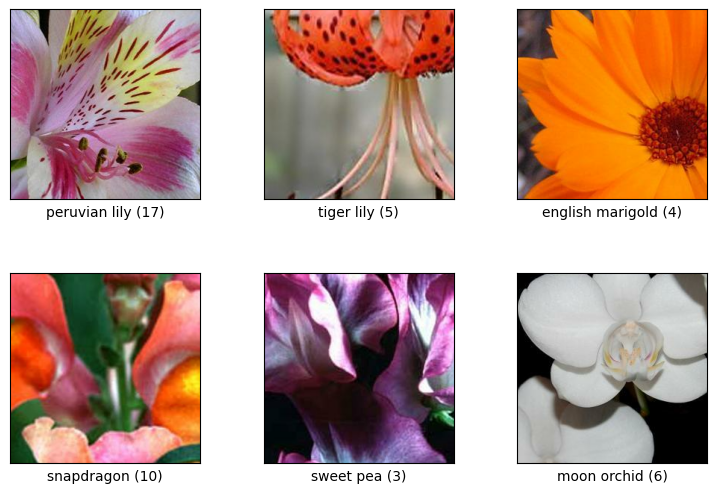

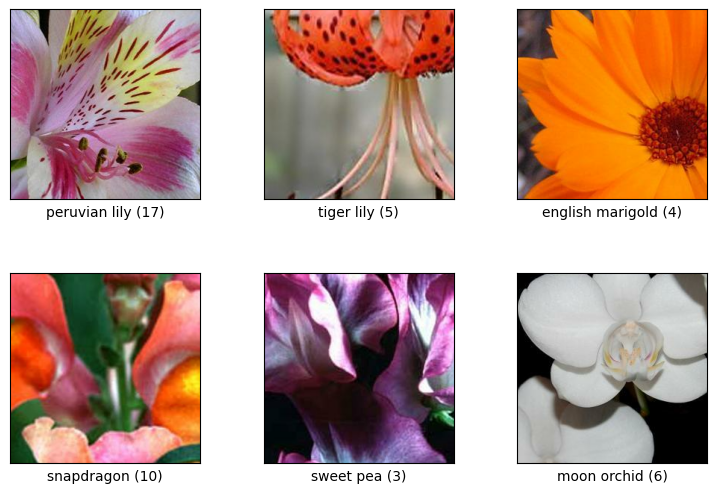

In [4]:
# Display examples from the training dataset
tfds.show_examples(train_ds, ds_info=info, rows=2, cols=3)


In [5]:
def get_x_y_from_ds(ds):
    x, y = [], []
    for img, label in ds.cache().as_numpy_iterator():
        x.append(img)  # Append each image from the dataset to the x list
        y.append(label)  # Append the corresponding label to the y list

    return np.array(x), np.array(y)  # Convert x and y lists to numpy arrays and return them

x_train, y_train = get_x_y_from_ds(train_ds)  # Get x_train and y_train from the training dataset
x_test, y_test = get_x_y_from_ds(valid_ds)  # Get x_test and y_test from the validation dataset

print(len(x_train), len(y_train), len(x_test), len(y_test))  # Print the lengths of x_train, y_train, x_test, and y_test


200 200 200 200


# Extract vectors and plot the embeddings

In [6]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import plotly.express as px

def plot_embeddings(features, labels):
    # Perform dimensionality reduction using t-SNE
    pca = TSNE(n_components=2, learning_rate='auto', init='pca')
    reduced_features = pca.fit_transform(features)

    # Convert integer labels to string labels
    str_labels = list(map(int_to_class_label, labels))

    # Create a scatter plot using Plotly Express
    # x-axis: values from the first dimension of the reduced features
    # y-axis: values from the second dimension of the reduced features
    # color: string labels to distinguish different classes
    # symbol: integer labels to visually differentiate points
    fig = px.scatter(x=reduced_features[:, 0], y=reduced_features[:, 1], color=str_labels, symbol=labels)

    # Display the plot
    fig.show()


In [7]:
MODEL_URL = "https://tfhub.dev/google/imagenet/resnet_v2_50/feature_vector/5"

In [8]:
# Create a sequential model using the TensorFlow Keras API
# The model will serve as a feature vectorizer

vectorizer = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL, trainable=False)
])

# Build the model by specifying the input shape
# The shape is set to [None, IMG_HEIGHT, IMG_WIDTH, 3]
# The None dimension allows variable batch sizes

vectorizer.build([None, IMG_HEIGHT, IMG_WIDTH, 3])

# Print a summary of the model architecture and parameter count

vectorizer.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 2048)              23564800  
                                                                 
Total params: 23,564,800
Trainable params: 0
Non-trainable params: 23,564,800
_________________________________________________________________


In [9]:
# Pre-compute features using the pre-trained vectorizer on the test data
pre_trained_features = vectorizer.predict(x_test)

# Plot the embeddings using the computed features and corresponding labels
plot_embeddings(features=pre_trained_features, labels=y_test)


7/7 [==============================] - 10s 185ms/step


In [10]:
def show_similar_images(images, labels, vectorizer, knn, start_image_idx, n_inputs=5, n_neighbors=10):
    # Extract a subset of input images
    input_images = images[start_image_idx:start_image_idx + n_inputs]
    
    # Extract features from the input images using the vectorizer
    features = vectorizer.predict(input_images)
    
    # Find the nearest neighbors of the input image features using the k-NN model
    knn_output = knn.kneighbors(features, n_neighbors=n_neighbors)
    
    # Combine the input images with their corresponding distances and neighbors
    images_with_distances_and_nbors = zip(input_images, *knn_output)
    
    # Create a figure and axes for plotting the images
    fig, axes = plt.subplots(len(input_images), n_neighbors + 1, figsize=(20, len(input_images) * 4))
    
    # Iterate over each input image and its neighbors
    for i, (image, distances, nbors) in enumerate(images_with_distances_and_nbors):
        for j in range(n_neighbors + 1):
            ax = axes[i, j]
            
            # Choose the image to display based on the neighbor index
            img = (image if j == 0 else images[nbors[j - 1]])
            
            # Set the title and label for the current axis
            if j == 0:
                ax.set_title("Input Image")
            else:
                ax.set_title(f"Sim: {1 - distances[j - 1]:.2f}")
                ax.set_xlabel(f"lbl: {labels[nbors[j - 1]]}")
            
            # Remove ticks from the x-axis and y-axis
            ax.get_xaxis().set_ticks([])
            ax.get_yaxis().set_ticks([])
            
            # Display the image on the current axis
            ax.imshow(img)


1/1 [==============================] - 1s 712ms/step


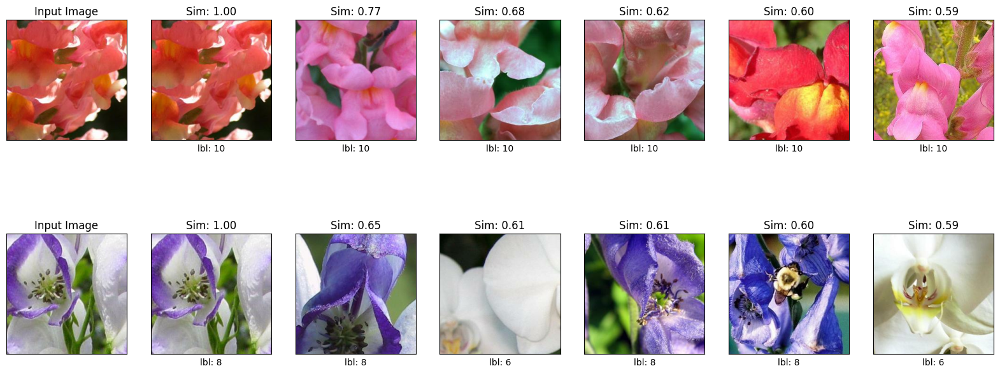

In [11]:
# Example usage
from sklearn.neighbors import NearestNeighbors
def get_knn(features):
    knn = NearestNeighbors(n_neighbors=5, metric="cosine")
    knn.fit(features)
    return knn

pretrained_knn = get_knn(features=pre_trained_features)


start_image_idx = 100  # Update with the desired index of the start image
n_inputs = 2  # Update with the desired number of input images
n_neighbors = 6  # Update with the desired number of similar images

show_similar_images(x_test, y_test, vectorizer, pretrained_knn, start_image_idx, n_inputs, n_neighbors)


1/1 [==============================] - 1s 650ms/step


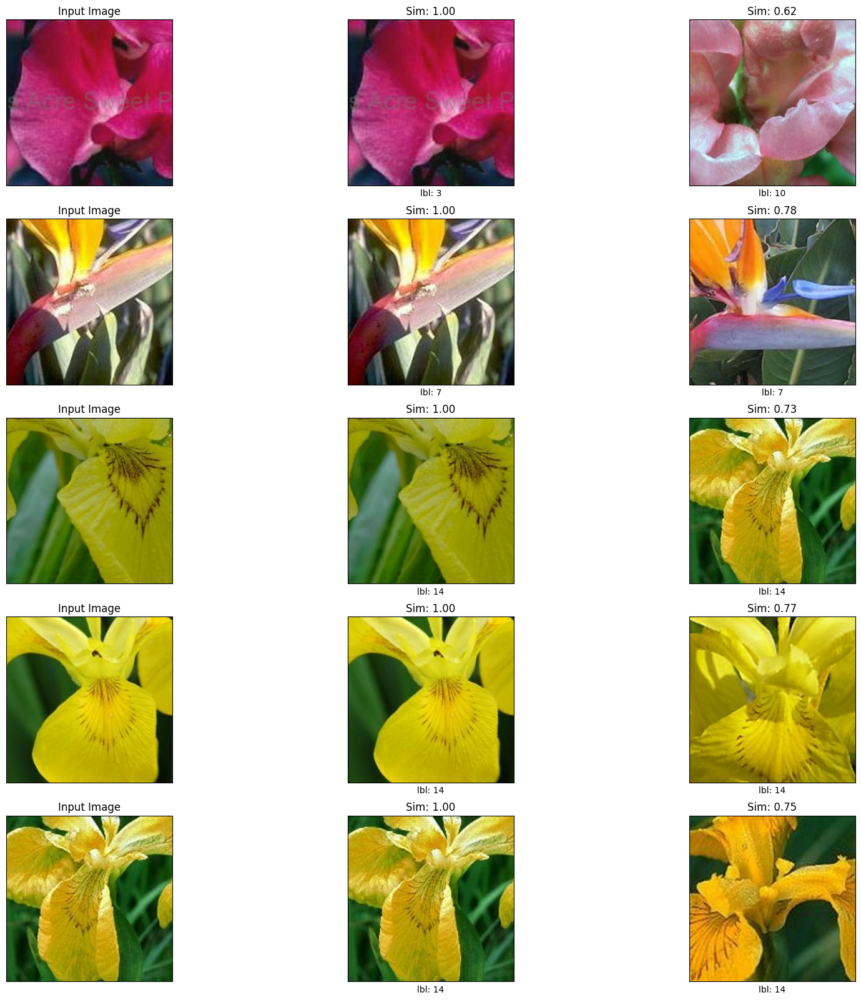

In [12]:
# Example usage
start_image_idx = 0  # Update with the desired index of the start image
n_inputs = 5  # Update with the desired number of input images
n_neighbors = 2  # Update with the desired number of similar images

show_similar_images(x_test, y_test, vectorizer, pretrained_knn, start_image_idx, n_inputs, n_neighbors)


# Fine tune the model

In [13]:
tuned_vectorizer = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),  # Randomly flips images horizontally and vertically
    tf.keras.layers.RandomRotation(0.2),  # Randomly rotates images by a maximum of 20 degrees
    hub.KerasLayer(MODEL_URL, trainable=True),  # Loads the pre-trained model from the given URL and makes it trainable
    tf.keras.layers.Dropout(0.3),  # Applies dropout regularization to prevent overfitting
    tf.keras.layers.Dense(384, activation=None),  # Adds a dense layer with 384 units and no activation function
    tf.keras.layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))  # Performs L2 normalization on the embeddings
])

tuned_vectorizer.build([None, IMG_HEIGHT, IMG_WIDTH, 3])  # Builds the model with the specified input shape
tuned_vectorizer.summary()  # Prints the summary of the model architecture


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_flip (RandomFlip)    (None, 256, 256, 3)       0         
                                                                 
 random_rotation (RandomRota  (None, 256, 256, 3)      0         
 tion)                                                           
                                                                 
 keras_layer_1 (KerasLayer)  (None, 2048)              23564800  
                                                                 
 dropout (Dropout)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 384)               786816    
                                                                 
 lambda (Lambda)             (None, 384)               0         
                                                      

On all datasets we train using a batch size of 128. Batches are
constructed with a fixed number n examples per class by adding
classes until the batch is full. When a class has fewer than n
examples, we use all the examples from the class. If this leads
to a case where the last class in the batch does not have space
for n images, we just include enough images to fill the batch

In [14]:
from collections import defaultdict
import random

def get_training_batch(images, labels, batch_size=128, n_examples_per_class=3):
    # Group examples by class label
    examples_per_class = defaultdict(list)
    for x, y in zip(images, labels):
        examples_per_class[y].append(x)
    
    while True:
        batch_X, batch_y = [], []
        while len(batch_X) < batch_size:
            for cls, examples in examples_per_class.items():
                # Determine the number of samples to select from each class
                n_sample = min(n_examples_per_class, (batch_size - len(batch_X)))
                if n_sample == 0:
                    break
                # Randomly select samples from the class
                samples = random.sample(examples, k=n_sample)
                # Add the selected samples and corresponding labels to the batch
                batch_X.extend(samples)
                batch_y.extend([cls] * len(samples))

        # Yield the batch as numpy arrays
        yield np.array(batch_X), np.array(batch_y)


In [15]:
# Install the TensorFlow Addons library
!pip install tensorflow_addons

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 591.0/591.0 kB 11.4 MB/s eta 0:00:00


In [16]:
bs = 64  # Batch size for training
n_examples_per_class = 3  # Number of examples per class in each batch
initial_lr = 0.0001  # Initial learning rate
epochs = 80  # Number of epochs for training

import tensorflow_addons as tfa  # Importing TensorFlow Addons library

# Compile the tuned vectorizer model with the Adam optimizer and TripletSemiHardLoss as the loss function
tuned_vectorizer.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=initial_lr),
                         loss=tfa.losses.TripletSemiHardLoss())

# Fit the tuned vectorizer model on the training data using a custom training batch generator
# Add an EarlyStopping callback with a patience of 5 to stop training early if no improvement is observed
# Train for the specified number of epochs, with steps_per_epoch calculated based on the batch size and training data size
# Use the validation data for monitoring the model's performance during training
history = tuned_vectorizer.fit(get_training_batch(images=x_train, labels=y_train, batch_size=bs, n_examples_per_class=n_examples_per_class),
                               callbacks=[tf.keras.callbacks.EarlyStopping(patience=5)],
                               epochs=epochs,
                               steps_per_epoch=len(x_train)//bs,
                               validation_data=(x_test, y_test),
                               validation_batch_size=bs,
                              )


Epoch 1/80


/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning:



TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 




3/3 [==============================] - 62s 2s/step - loss: 1.2373 - val_loss: 1.1757
Epoch 2/80
3/3 [==============================] - 3s 971ms/step - loss: 1.2229 - val_loss: 1.1584
Epoch 3/80
3/3 [==============================] - 3s 976ms/step - loss: 1.1993 - val_loss: 1.1354
Epoch 4/80
3/3 [==============================] - 3s 978ms/step - loss: 1.2011 - val_loss: 1.1113
Epoch 5/80
3/3 [==============================] - 3s 1s/step - loss: 1.1485 - val_loss: 1.0876
Epoch 6/80
3/3 [==============================] - 3s 1s/step - loss: 1.1199 - val_loss: 1.0617
Epoch 7/80
3/3 [==============================] - 3s 986ms/step - loss: 1.0902 - val_loss: 1.0342
Epoch 8/80
3/3 [==============================] - 3s 981ms/step - loss: 1.0472 - val_loss: 1.0008
Epoch 9/80
3/3 [==============================] - 3s 998ms/step - loss: 1.0179 - val_loss: 0.9641
Epoch 10/80
3/3 [==============================] - 3s 996ms/step - loss: 0.9577 - val_loss: 0.9303
Epoch 11/80
3/3 [=====================

In [ ]:
bs = 64
n_examples_per_class = 3
initial_lr = 0.0001
epochs = 80
import tensorflow_addons as tfa

tuned_vectorizer.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=initial_lr),
                         loss=tfa.losses.TripletSemiHardLoss())

history = tuned_vectorizer.fit(get_training_batch(images=x_train, labels=y_train, batch_size=bs, n_examples_per_class=n_examples_per_class),
                               callbacks=[tf.keras.callbacks.EarlyStopping(patience=5)],
                               epochs=epochs, 
                               steps_per_epoch=len(x_train)//bs, 
                               validation_data=(x_test, y_test),
                               validation_batch_size=bs,
                              )

Epoch 1/80
3/3 [==============================] - 13s 1s/step - loss: 1.2295 - val_loss: 1.1830
Epoch 2/80
3/3 [==============================] - 3s 1s/step - loss: 1.2226 - val_loss: 1.1624
Epoch 3/80
3/3 [==============================] - 3s 1s/step - loss: 1.1953 - val_loss: 1.1398
Epoch 4/80
3/3 [==============================] - 3s 1s/step - loss: 1.1615 - val_loss: 1.1127
Epoch 5/80
3/3 [==============================] - 3s 1s/step - loss: 1.0942 - val_loss: 1.0847
Epoch 6/80
3/3 [==============================] - 3s 1s/step - loss: 1.0781 - val_loss: 1.0489
Epoch 7/80
3/3 [==============================] - 3s 1s/step - loss: 1.0200 - val_loss: 1.0158
Epoch 8/80
3/3 [==============================] - 3s 1s/step - loss: 0.9618 - val_loss: 0.9920
Epoch 9/80
3/3 [==============================] - 3s 1s/step - loss: 0.9309 - val_loss: 0.9773
Epoch 10/80
3/3 [==============================] - 3s 1s/step - loss: 0.8888 - val_loss: 0.9598
Epoch 11/80
3/3 [==============================]

In [17]:
bs = 64  # Batch size
frozen_features = tuned_vectorizer.predict(x_test)  # Extract features from the test data using the tuned vectorizer
plot_embeddings(features=frozen_features, labels=y_test)  # Plot the embeddings using the extracted features and corresponding labels


7/7 [==============================] - 2s 110ms/step


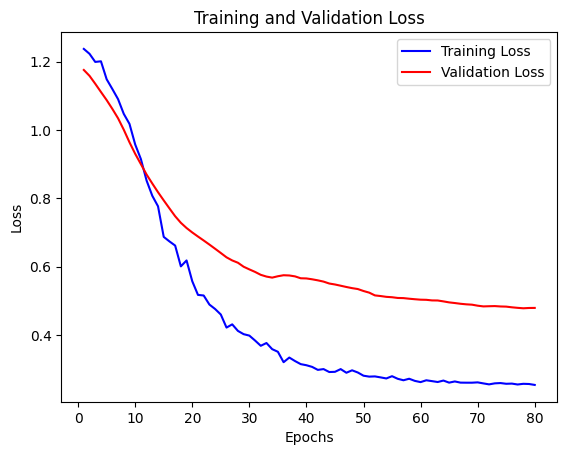

In [18]:
import matplotlib.pyplot as plt

# Access the loss values from the model history
train_loss = history.history['loss']  # Training loss values
val_loss = history.history['val_loss']  # Validation loss values

# Plotting the loss curve
epochs = range(1, len(train_loss) + 1)  # Range of epochs for x-axis
plt.plot(epochs, train_loss, 'b', label='Training Loss')  # Plotting training loss
plt.plot(epochs, val_loss, 'r', label='Validation Loss')  # Plotting validation loss
plt.title('Training and Validation Loss')  # Set the title of the plot
plt.xlabel('Epochs')  # Set the label for the x-axis
plt.ylabel('Loss')  # Set the label for the y-axis
plt.legend()  # Display the legend
plt.show()  # Show the plot


In [20]:
from sklearn.metrics import confusion_matrix

# Make predictions on the test set
y_pred = tuned_vectorizer.predict(x_test)

# Convert the predicted probabilities to class labels
y_pred = np.argmax(y_pred, axis=1)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Print the confusion matrix
print("Confusion Matrix:")
print(cm)


7/7 [==============================] - 1s 110ms/step
Confusion Matrix:
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 2]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


1/1 [==============================] - 0s 37ms/step


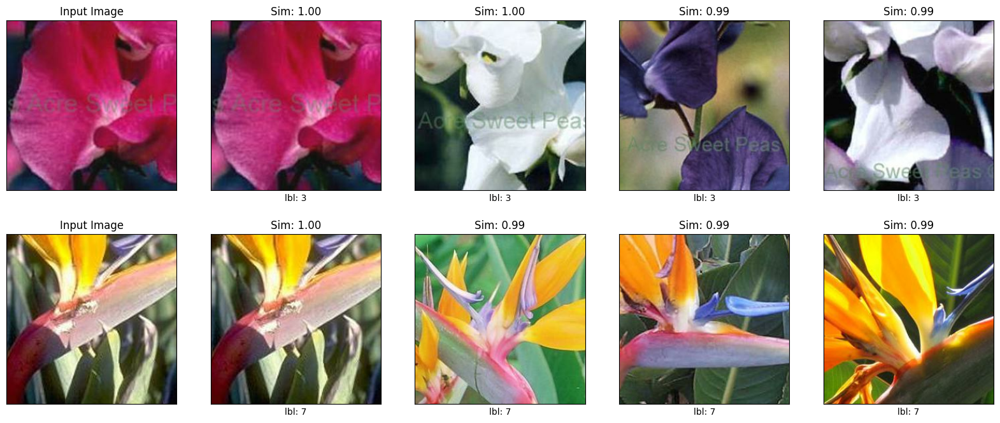

In [22]:
# Example usage
frozen_knn = get_knn(features=frozen_features)

start_image_idx = 0  # Update with the desired index of the start image
n_inputs = 2  # Update with the desired number of input images
n_neighbors = 4  # Update with the desired number of similar images

show_similar_images(x_test, y_test, tuned_vectorizer, frozen_knn, start_image_idx, n_inputs, n_neighbors)


Save Model


In [23]:
# Assuming tuned_vectorizer is your trained model

# Define the path to save the model
model_path = '/content/model.h5'

# Save the model
tuned_vectorizer.save(model_path)


Load Model

In [28]:

my_reloaded_model = tf.keras.models.load_model((model_path),custom_objects={'KerasLayer':hub.KerasLayer})

interactive(children=(IntSlider(value=0, continuous_update=False, description='start_image_idx', max=199), Int…

<function __main__.show_similar_images(images, labels, vectorizer, knn, start_image_idx, n_inputs=5, n_neighbors=10)>

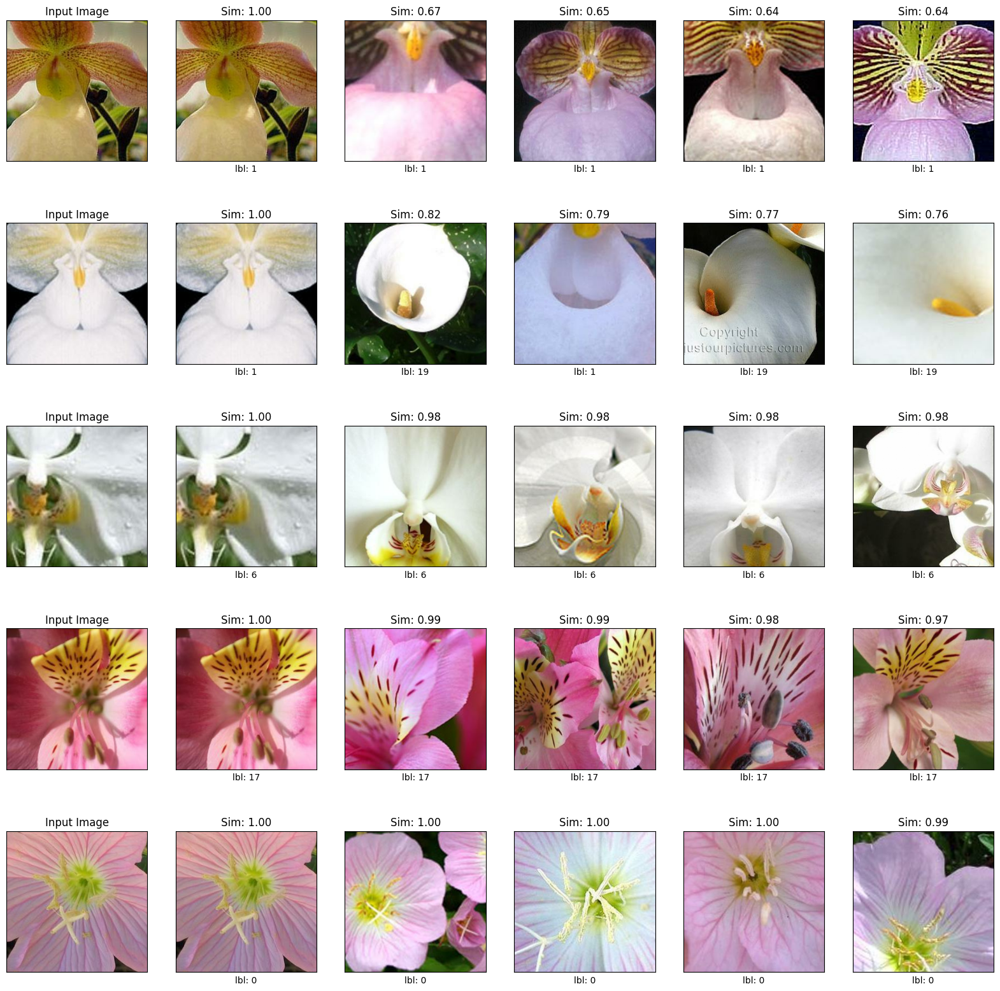

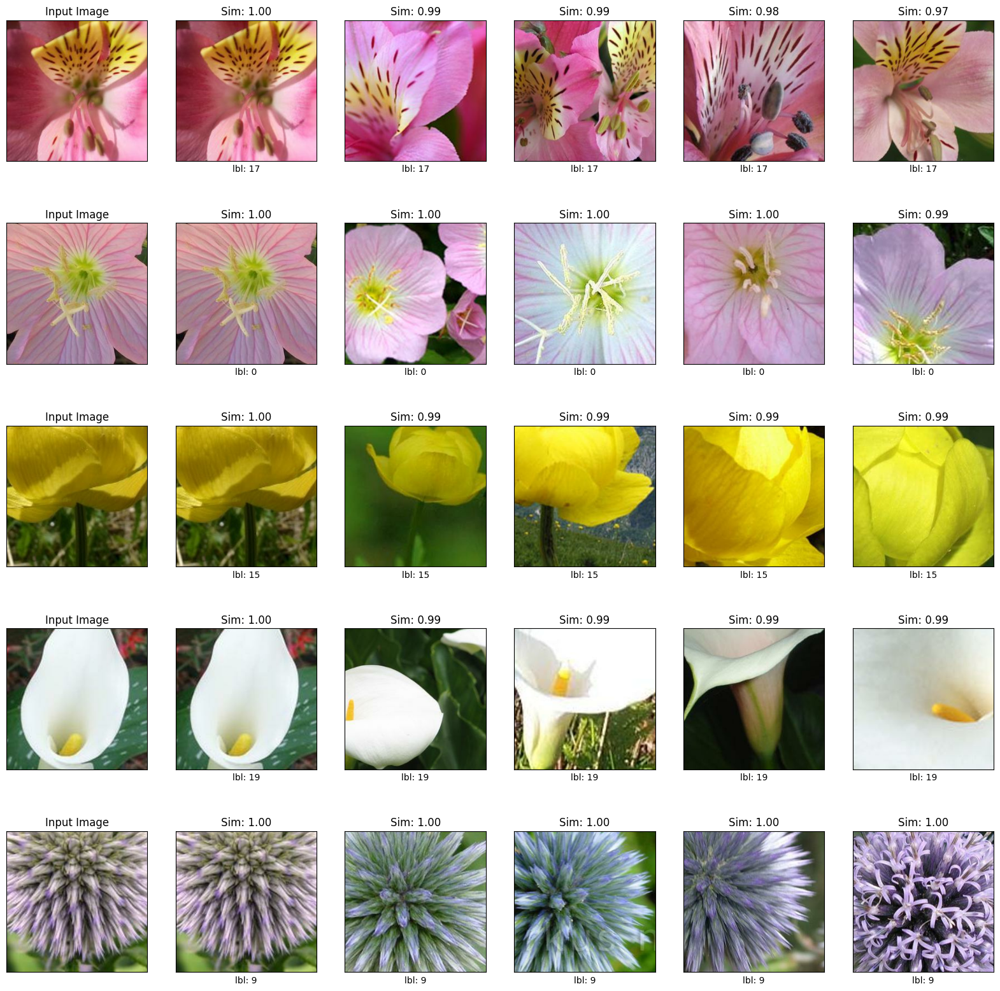

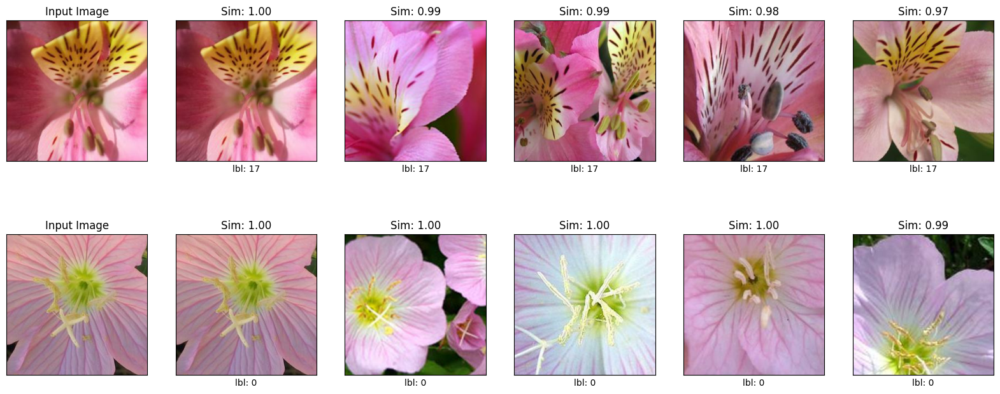

In [ ]:
w.interact(
    show_similar_images,  # Call the show_similar_images function
    images=w.fixed(x_test),  # Use the x_test dataset as the fixed input for the 'images' parameter
    labels=w.fixed(y_test),  # Use the y_test labels as the fixed input for the 'labels' parameter
    vectorizer=w.fixed(tuned_vectorizer),  # Use the tuned_vectorizer as the fixed input for the 'vectorizer' parameter
    knn=w.fixed(frozen_knn),  # Use the frozen_knn as the fixed input for the 'knn' parameter
    start_image_idx=w.IntSlider(max=len(x_test) - 1, continuous_update=False),  # Create a slider widget for selecting the start_image_idx parameter (maximum value is the length of x_test - 1)
    n_inputs=w.IntSlider(min=2, value=5, max=10, continuous_update=False),  # Create a slider widget for selecting the n_inputs parameter (minimum value is 2, default value is 5, maximum value is 10)
    n_neighbors=w.IntSlider(min=2, value=5, max=10, continuous_update=False),  # Create a slider widget for selecting the n_neighbors parameter (minimum value is 2, default value is 5, maximum value is 10)
)
